## Exploratory Data Analysis

Use this notebook to get familiar with the datasets we have. There is 10 questions we need to answer during the EDA.


We shouldn't limit our EDA to these 10 questions. Let's be creative :).

In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
from scipy.stats import shapiro
from scipy.stats import anderson
from IPython.display import JSON
import json
import requests as re

In [2]:
#import data into dataframe
df_train = pd.read_csv('../../../data/preprocessed_data/df_flights_clean.csv')
df_train.head()


,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
0,2019-05-10,WN,1912,WN,BWI,"Baltimore, MD",FLL,"Fort Lauderdale, FL",1105,1115.0,...,1128.0,1330.0,3.0,1345,1333.0,-12.0,160,138.0,122.0,925
1,2019-04-27,AA,3666,MQ,JFK,"New York, NY",CLE,"Cleveland, OH",1545,1548.0,...,1623.0,1743.0,5.0,1747,1748.0,1.0,122,120.0,80.0,425
2,2018-03-08,WN,588,WN,ORF,"Norfolk, VA",BWI,"Baltimore, MD",1000,1012.0,...,1020.0,1058.0,4.0,1100,1102.0,2.0,60,50.0,38.0,159
3,2018-04-05,AA,1618,AA,PHX,"Phoenix, AZ",MIA,"Miami, FL",1330,1332.0,...,1343.0,2019.0,7.0,2048,2026.0,-22.0,258,234.0,216.0,1972
4,2018-01-31,UA,4171,EV,CHA,"Chattanooga, TN",EWR,"Newark, NJ",600,547.0,...,606.0,745.0,20.0,818,805.0,-13.0,138,138.0,99.0,718


In [3]:
#check data types of columns
df_train.dtypes

fl_date                 object
mkt_carrier             object
mkt_carrier_fl_num       int64
op_unique_carrier       object
origin                  object
origin_city_name        object
dest                    object
dest_city_name          object
crs_dep_time             int64
dep_time               float64
dep_delay              float64
taxi_out               float64
wheels_off             float64
wheels_on              float64
taxi_in                float64
crs_arr_time             int64
arr_time               float64
arr_delay              float64
crs_elapsed_time         int64
actual_elapsed_time    float64
air_time               float64
distance                 int64
dtype: object

In [4]:
df_train.head()

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
0,2019-05-10,WN,1912,WN,BWI,"Baltimore, MD",FLL,"Fort Lauderdale, FL",1105,1115.0,...,1128.0,1330.0,3.0,1345,1333.0,-12.0,160,138.0,122.0,925
1,2019-04-27,AA,3666,MQ,JFK,"New York, NY",CLE,"Cleveland, OH",1545,1548.0,...,1623.0,1743.0,5.0,1747,1748.0,1.0,122,120.0,80.0,425
2,2018-03-08,WN,588,WN,ORF,"Norfolk, VA",BWI,"Baltimore, MD",1000,1012.0,...,1020.0,1058.0,4.0,1100,1102.0,2.0,60,50.0,38.0,159
3,2018-04-05,AA,1618,AA,PHX,"Phoenix, AZ",MIA,"Miami, FL",1330,1332.0,...,1343.0,2019.0,7.0,2048,2026.0,-22.0,258,234.0,216.0,1972
4,2018-01-31,UA,4171,EV,CHA,"Chattanooga, TN",EWR,"Newark, NJ",600,547.0,...,606.0,745.0,20.0,818,805.0,-13.0,138,138.0,99.0,718


In [5]:
#split up numerical variables
num_feats = ['dep_delay', 'taxi_out', 'taxi_in', 'arr_delay', 'distance', 'air_time']


df_train[num_feats].describe()

,dep_delay,taxi_out,taxi_in,arr_delay,distance,air_time
count,293922.000000,293922.000000,293922.000000,293922.000000,293922.000000,293922.000000
mean,10.571155,17.521938,7.651054,5.547431,771.337607,108.044049
std,48.178484,10.018156,6.020398,50.375212,586.850668,69.673360
min,-330.000000,0.000000,0.000000,-160.000000,31.000000,7.000000
25%,-6.000000,11.000000,4.000000,-15.000000,342.000000,58.000000
50%,-2.000000,15.000000,6.000000,-6.000000,604.000000,89.000000
75%,7.000000,20.000000,9.000000,8.000000,1008.000000,137.000000
max,2058.000000,163.000000,178.000000,2041.000000,5095.000000,681.000000


#### **Task 1**: Test the hypothesis that the delay is from Normal distribution. and that **mean** of the delay is 0. Be careful about the outliers.

In [6]:
#importing data
df_flights = pd.read_csv('../../../data/preprocessed_data/df_flights_clean.csv')
df_flights.head(5)

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
0,2019-05-10,WN,1912,WN,BWI,"Baltimore, MD",FLL,"Fort Lauderdale, FL",1105,1115.0,...,1128.0,1330.0,3.0,1345,1333.0,-12.0,160,138.0,122.0,925
1,2019-04-27,AA,3666,MQ,JFK,"New York, NY",CLE,"Cleveland, OH",1545,1548.0,...,1623.0,1743.0,5.0,1747,1748.0,1.0,122,120.0,80.0,425
2,2018-03-08,WN,588,WN,ORF,"Norfolk, VA",BWI,"Baltimore, MD",1000,1012.0,...,1020.0,1058.0,4.0,1100,1102.0,2.0,60,50.0,38.0,159
3,2018-04-05,AA,1618,AA,PHX,"Phoenix, AZ",MIA,"Miami, FL",1330,1332.0,...,1343.0,2019.0,7.0,2048,2026.0,-22.0,258,234.0,216.0,1972
4,2018-01-31,UA,4171,EV,CHA,"Chattanooga, TN",EWR,"Newark, NJ",600,547.0,...,606.0,745.0,20.0,818,805.0,-13.0,138,138.0,99.0,718


In [7]:
#creating arrival and departure dealy datasets
arr_delay = df_flights.arr_delay
dep_delay = df_flights.dep_delay

In [8]:
dep_delay.describe(), arr_delay.describe()

(count    293922.000000
 mean         10.571155
 std          48.178484
 min        -330.000000
 25%          -6.000000
 50%          -2.000000
 75%           7.000000
 max        2058.000000
 Name: dep_delay, dtype: float64,
 count    293922.000000
 mean          5.547431
 std          50.375212
 min        -160.000000
 25%         -15.000000
 50%          -6.000000
 75%           8.000000
 max        2041.000000
 Name: arr_delay, dtype: float64)

In [9]:
#lower and upper limits
q1_arr_delay = arr_delay.quantile(0.25)
q3_arr_delay = arr_delay.quantile(0.75)
iqr_arr_delay = q3_arr_delay - q1_arr_delay
lower_limit_arr_delay = q1_arr_delay - 1.5 * iqr_arr_delay
upper_limit_arr_delay = q3_arr_delay + 1.5 * iqr_arr_delay

q1_dep_delay = dep_delay.quantile(0.25)
q3_dep_delay = dep_delay.quantile(0.75)
iqr_dep_delay = q3_dep_delay - q1_dep_delay
lower_limit_dep_delay = q1_dep_delay - 1.5 * iqr_dep_delay
upper_limit_dep_delay = q3_dep_delay + 1.5 * iqr_dep_delay

upper_limit_arr_delay, lower_limit_arr_delay, lower_limit_dep_delay, upper_limit_dep_delay 

(42.5, -49.5, -25.5, 26.5)

In [10]:
#dispay all ouliers for the arrival delay
df_flights[(df_flights.arr_delay<lower_limit_arr_delay) | (df_flights.arr_delay>upper_limit_arr_delay)]


,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
10,2019-01-31,B6,1459,B6,BDL,"Hartford, CT",FLL,"Fort Lauderdale, FL",2000,2045.0,...,2103.0,2351.0,7.0,2307,2358.0,51.0,187,193.0,168.0,1173
11,2019-06-19,UA,4634,AX,SGF,"Springfield, MO",ORD,"Chicago, IL",826,1013.0,...,1023.0,1127.0,6.0,1010,1133.0,83.0,104,80.0,64.0,438
17,2019-01-31,AS,3372,OO,STS,"Santa Rosa, CA",LAX,"Los Angeles, CA",1720,1752.0,...,1842.0,1938.0,13.0,1900,1951.0,51.0,100,119.0,56.0,400
25,2019-06-18,DL,1585,DL,LGA,"New York, NY",MCO,"Orlando, FL",1830,2319.0,...,2338.0,200.0,6.0,2121,206.0,285.0,171,167.0,142.0,950
27,2019-02-17,B6,1336,B6,DTW,"Detroit, MI",BOS,"Boston, MA",1836,1912.0,...,2005.0,2114.0,17.0,2025,2131.0,66.0,109,139.0,69.0,632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293883,2018-10-13,AA,3821,MQ,ORD,"Chicago, IL",ALB,"Albany, NY",1245,1403.0,...,1420.0,1643.0,3.0,1542,1646.0,64.0,117,103.0,83.0,723
293891,2019-01-14,DL,2777,DL,SFO,"San Francisco, CA",LAX,"Los Angeles, CA",725,824.0,...,846.0,1009.0,5.0,902,1014.0,72.0,97,110.0,83.0,337
293901,2018-12-03,AA,3283,OO,ORD,"Chicago, IL",CVG,"Cincinnati, OH",1655,1810.0,...,1858.0,2047.0,7.0,1909,2054.0,105.0,74,104.0,49.0,264
293911,2019-03-09,AA,2506,AA,ORD,"Chicago, IL",PHL,"Philadelphia, PA",2205,2314.0,...,2328.0,153.0,5.0,101,158.0,57.0,116,104.0,85.0,678


In [11]:
#dispay all ouliers for the departure delay
df_flights[(df_flights.dep_delay<lower_limit_dep_delay) | (df_flights.dep_delay>upper_limit_dep_delay)]

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
10,2019-01-31,B6,1459,B6,BDL,"Hartford, CT",FLL,"Fort Lauderdale, FL",2000,2045.0,...,2103.0,2351.0,7.0,2307,2358.0,51.0,187,193.0,168.0,1173
11,2019-06-19,UA,4634,AX,SGF,"Springfield, MO",ORD,"Chicago, IL",826,1013.0,...,1023.0,1127.0,6.0,1010,1133.0,83.0,104,80.0,64.0,438
17,2019-01-31,AS,3372,OO,STS,"Santa Rosa, CA",LAX,"Los Angeles, CA",1720,1752.0,...,1842.0,1938.0,13.0,1900,1951.0,51.0,100,119.0,56.0,400
25,2019-06-18,DL,1585,DL,LGA,"New York, NY",MCO,"Orlando, FL",1830,2319.0,...,2338.0,200.0,6.0,2121,206.0,285.0,171,167.0,142.0,950
27,2019-02-17,B6,1336,B6,DTW,"Detroit, MI",BOS,"Boston, MA",1836,1912.0,...,2005.0,2114.0,17.0,2025,2131.0,66.0,109,139.0,69.0,632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293891,2019-01-14,DL,2777,DL,SFO,"San Francisco, CA",LAX,"Los Angeles, CA",725,824.0,...,846.0,1009.0,5.0,902,1014.0,72.0,97,110.0,83.0,337
293898,2019-02-17,WN,3507,WN,LAS,"Las Vegas, NV",DEN,"Denver, CO",1635,1703.0,...,1732.0,1951.0,7.0,1920,1958.0,38.0,105,115.0,79.0,628
293901,2018-12-03,AA,3283,OO,ORD,"Chicago, IL",CVG,"Cincinnati, OH",1655,1810.0,...,1858.0,2047.0,7.0,1909,2054.0,105.0,74,104.0,49.0,264
293911,2019-03-09,AA,2506,AA,ORD,"Chicago, IL",PHL,"Philadelphia, PA",2205,2314.0,...,2328.0,153.0,5.0,101,158.0,57.0,116,104.0,85.0,678


In [12]:
#remove arrival delays ouliers
df_flights_no_outliers = df_flights[(df_flights.arr_delay>lower_limit_arr_delay) & (df_flights.arr_delay<upper_limit_arr_delay)]

In [13]:
#remove arrival arrival ouliers
df_flights_no_outliers = df_flights_no_outliers[(df_flights_no_outliers.dep_delay>lower_limit_dep_delay) & (df_flights_no_outliers.dep_delay<upper_limit_dep_delay)]
df_flights_no_outliers

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
0,2019-05-10,WN,1912,WN,BWI,"Baltimore, MD",FLL,"Fort Lauderdale, FL",1105,1115.0,...,1128.0,1330.0,3.0,1345,1333.0,-12.0,160,138.0,122.0,925
1,2019-04-27,AA,3666,MQ,JFK,"New York, NY",CLE,"Cleveland, OH",1545,1548.0,...,1623.0,1743.0,5.0,1747,1748.0,1.0,122,120.0,80.0,425
2,2018-03-08,WN,588,WN,ORF,"Norfolk, VA",BWI,"Baltimore, MD",1000,1012.0,...,1020.0,1058.0,4.0,1100,1102.0,2.0,60,50.0,38.0,159
3,2018-04-05,AA,1618,AA,PHX,"Phoenix, AZ",MIA,"Miami, FL",1330,1332.0,...,1343.0,2019.0,7.0,2048,2026.0,-22.0,258,234.0,216.0,1972
4,2018-01-31,UA,4171,EV,CHA,"Chattanooga, TN",EWR,"Newark, NJ",600,547.0,...,606.0,745.0,20.0,818,805.0,-13.0,138,138.0,99.0,718
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293916,2018-02-25,AA,3709,MQ,ORD,"Chicago, IL",GRB,"Green Bay, WI",1319,1312.0,...,1321.0,1355.0,2.0,1414,1357.0,-17.0,55,45.0,34.0,173
293917,2018-04-13,AA,3678,MQ,TLH,"Tallahassee, FL",MIA,"Miami, FL",605,603.0,...,615.0,717.0,6.0,731,723.0,-8.0,86,80.0,62.0,402
293918,2018-10-06,DL,3674,OO,SLC,"Salt Lake City, UT",BZN,"Bozeman, MT",1105,1101.0,...,1116.0,1208.0,7.0,1230,1215.0,-15.0,85,74.0,52.0,347
293919,2018-12-13,DL,892,DL,ATL,"Atlanta, GA",LEX,"Lexington, KY",1814,1815.0,...,1835.0,1921.0,5.0,1927,1926.0,-1.0,73,71.0,46.0,304


In [14]:
arr_delay = df_flights_no_outliers.arr_delay
dep_delay = df_flights_no_outliers.dep_delay

In [15]:
# Check distribution
g = sns.distplot(arr_delay, kde=True, rug=False,label='Arrival delay')
g2 = sns.distplot(dep_delay, kde=True, rug=False, label='Departure delay')
plt.legend()

D:\Anaconda\envs\Bootcamp\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\envs\Bootcamp\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


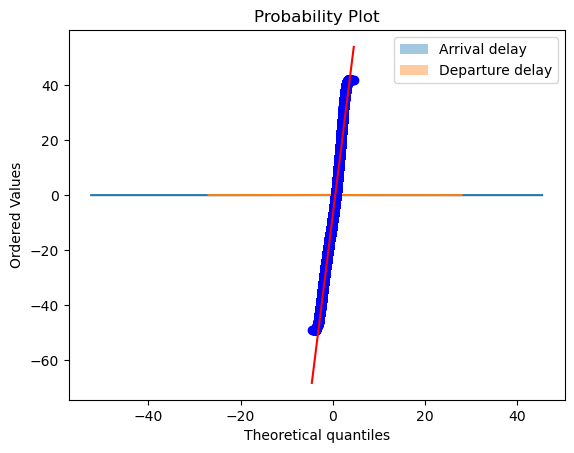

In [16]:
stats.probplot(arr_delay, dist="norm", plot=plt)
plt.show()

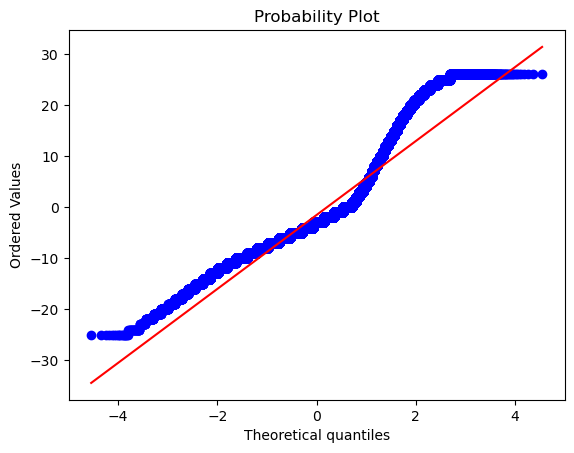

In [17]:
stats.probplot(dep_delay, dist="norm", plot=plt)
plt.show()

In [18]:
# Shapiro-Wilk Normality Test
stat, p = shapiro(arr_delay)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Probably Gaussian')
else:
    print('Probably not Gaussian')

stat=0.982, p=0.000
Probably not Gaussian


D:\Anaconda\envs\Bootcamp\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [19]:
print('P value is smaller than alpha, which means that we reject the null hypothesis')

P value is smaller than alpha, which means that we reject the null hypothesis


#### **Task 2**: Is average/median monthly delay different during the year? If yes, which are months with the biggest delays and what could be the reason?

In [20]:
date_split = df_flights_no_outliers['fl_date'].str.split('-')
date_split[:3]
df_flights_no_outliers['year'] = [x[0] for x in date_split]
df_flights_no_outliers['month'] = [x[1] for x in date_split]
df_flights_no_outliers['day'] = [x[2] for x in date_split]

In [21]:
df_flights_no_outliers.groupby(['year','month'])['dep_delay'].mean().unstack('year').plot.kde()
df_flights_no_outliers.groupby(['year','month'])['arr_delay'].mean().unstack('year').plot.kde()


<AxesSubplot:ylabel='Density'>

#### **Task 3**: Does the weather affect the delay? 
Use the API to pull the weather information for flights. There is no need to get weather for ALL flights. We can choose the right representative sample. Let's focus on four weather types:
- sunny
- cloudy
- rainy
- snow.
Test the hypothesis that these 4 delays are from the same distribution. If they are not, which ones are significantly different?

In [22]:
weather_df_flights_no_outliers = df_flights_no_outliers.sample(n=200)
weather_df_flights_no_outliers['weather_types'] = ''

In [23]:
#select random sample of 200 records
weather_df_flights_no_outliers.sample(n=200)
weather_df_flights_no_outliers

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance,year,month,day,weather_types
171485,2019-07-07,G4,1964,G4,VPS,"Valparaiso, FL",OKC,"Oklahoma City, OK",1136,1122.0,...,1324.0,-14.0,122,122.0,97.0,726,2019,07,07,
23363,2019-05-14,UA,6235,YV,IAH,"Houston, TX",IND,"Indianapolis, IN",725,724.0,...,1034.0,-10.0,139,130.0,110.0,844,2019,05,14,
81009,2019-11-03,WN,2624,WN,STL,"St. Louis, MO",TUL,"Tulsa, OK",2135,2131.0,...,2246.0,-4.0,75,75.0,60.0,351,2019,11,03,
11192,2018-03-03,AA,3932,MQ,ORD,"Chicago, IL",ATW,"Appleton, WI",2025,2021.0,...,2108.0,-14.0,57,47.0,31.0,160,2018,03,03,
166629,2019-10-09,DL,3909,OO,SAV,"Savannah, GA",JFK,"New York, NY",1751,1753.0,...,2017.0,4.0,142,144.0,96.0,718,2019,10,09,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95845,2018-11-11,WN,6083,WN,BOS,"Boston, MA",MKE,"Milwaukee, WI",955,951.0,...,1136.0,-4.0,165,165.0,144.0,860,2018,11,11,
203074,2018-06-04,DL,1053,DL,ATL,"Atlanta, GA",PBI,"West Palm Beach/Palm Beach, FL",1715,1720.0,...,1903.0,-3.0,111,103.0,81.0,545,2018,06,04,
51448,2018-03-29,UA,1853,UA,FLL,"Fort Lauderdale, FL",IAD,"Washington, DC",848,839.0,...,1105.0,-17.0,154,146.0,124.0,901,2018,03,29,
40720,2018-01-17,AA,3724,MQ,ORD,"Chicago, IL",CVG,"Cincinnati, OH",1250,1248.0,...,1446.0,-14.0,70,58.0,41.0,264,2018,01,17,


In [24]:
# connect to the API and get weather data for a particular city from startdate to enddate
#https://www.weatherapi.com/docs/  --History API
def get_weather(df):
    for x in range(200):       
        params = {'q': df.iloc[x].dest_city_name,
                  'date': df.iloc[x].fl_date,
                  'format': 'json',
                  'tp': 1, 
                  'key': '91a627fcac5948e2815230603221301'
                 }
        url = 'https://api.worldweatheronline.com/premium/v1/past-weather.ashx'
        
        response = re.get(url=url, params=params)
        json_data = response.json()
        temp = pd.json_normalize(json_data)
        df['weather_types'].iloc[x] = temp.iloc[0]['data.weather'][0]['hourly'][0]['weatherDesc'][0]['value']
    return df


In [25]:
get_weather(weather_df_flights_no_outliers)

D:\Anaconda\envs\Bootcamp\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance,year,month,day,weather_types
171485,2019-07-07,G4,1964,G4,VPS,"Valparaiso, FL",OKC,"Oklahoma City, OK",1136,1122.0,...,1324.0,-14.0,122,122.0,97.0,726,2019,07,07,Clear
23363,2019-05-14,UA,6235,YV,IAH,"Houston, TX",IND,"Indianapolis, IN",725,724.0,...,1034.0,-10.0,139,130.0,110.0,844,2019,05,14,Clear
81009,2019-11-03,WN,2624,WN,STL,"St. Louis, MO",TUL,"Tulsa, OK",2135,2131.0,...,2246.0,-4.0,75,75.0,60.0,351,2019,11,03,Clear
11192,2018-03-03,AA,3932,MQ,ORD,"Chicago, IL",ATW,"Appleton, WI",2025,2021.0,...,2108.0,-14.0,57,47.0,31.0,160,2018,03,03,Partly cloudy
166629,2019-10-09,DL,3909,OO,SAV,"Savannah, GA",JFK,"New York, NY",1751,1753.0,...,2017.0,4.0,142,144.0,96.0,718,2019,10,09,Partly cloudy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95845,2018-11-11,WN,6083,WN,BOS,"Boston, MA",MKE,"Milwaukee, WI",955,951.0,...,1136.0,-4.0,165,165.0,144.0,860,2018,11,11,Cloudy
203074,2018-06-04,DL,1053,DL,ATL,"Atlanta, GA",PBI,"West Palm Beach/Palm Beach, FL",1715,1720.0,...,1903.0,-3.0,111,103.0,81.0,545,2018,06,04,Cloudy
51448,2018-03-29,UA,1853,UA,FLL,"Fort Lauderdale, FL",IAD,"Washington, DC",848,839.0,...,1105.0,-17.0,154,146.0,124.0,901,2018,03,29,Overcast
40720,2018-01-17,AA,3724,MQ,ORD,"Chicago, IL",CVG,"Cincinnati, OH",1250,1248.0,...,1446.0,-14.0,70,58.0,41.0,264,2018,01,17,Freezing fog


In [26]:
# extra copy of retreaved dataset
temp = weather_df_flights_no_outliers
#weather_df_flights_no_outliers = temp

In [27]:
weather_df_flights_no_outliers.weather_types.isnull().any()

False

In [28]:
weather_df_flights_no_outliers.weather_types.value_counts()

Clear                                  110
Partly cloudy                           28
Patchy rain possible                    10
Cloudy                                   9
Overcast                                 7
Light rain shower                        5
Moderate or heavy rain shower            4
Torrential rain shower                   3
Mist                                     3
Light rain                               3
Moderate rain                            2
Patchy light rain                        2
Patchy heavy snow                        2
Light drizzle                            2
Moderate snow                            2
Patchy light snow                        2
Moderate or heavy rain with thunder      1
Patchy moderate snow                     1
Moderate or heavy snow showers           1
Heavy snow                               1
Heavy rain                               1
Freezing fog                             1
Name: weather_types, dtype: int64

In [29]:
#create list and sort accorning to the weather type we required
weather_dict= {
    'Clear':'sunny',
    'Partly cloudy':'cloudy',
    'Overcast': 'cloudy',
    'Patchy rain possible':'rainy',
    'Cloudy': 'cloudy',
    'Light rain shower':'rainy',
    'Mist':'rainy',
    'Moderate or heavy rain shower':'rainy',
    'Patchy light snow': 'snow',
    'Light rain': 'rainy',
    'Thundery outbreaks possible': 'rainy',
    'Torrential rain shower': 'rainy',
    'Light drizzle': 'rainy',
    'Patchy light drizzle': 'rainy',
    'Patchy light rain': 'rainy',
    'Light snow': 'snow',
    'Heavy snow': 'snow',
    'Moderate rain at times': 'rainy',
    'Patchy heavy snow': 'snow'
}
weather_df_flights_no_outliers.weather_types = weather_df_flights_no_outliers.weather_types.map(weather_dict)
weather_df_flights_no_outliers.weather_types.value_counts()

sunny     110
cloudy     44
rainy      32
snow        5
Name: weather_types, dtype: int64

In [30]:
group = weather_df_flights_no_outliers.groupby('weather_types',as_index=False).mean()
sns.barplot(x = 'dep_delay', y = 'weather_types', data = group )

<AxesSubplot:xlabel='dep_delay', ylabel='weather_types'>

In [31]:
cond = ['snow','rainy','cloudy','sunny']
for x in cond:
    sns.distplot( weather_df_flights_no_outliers[weather_df_flights_no_outliers.weather_types == x].dep_delay , label=x)
plt.xlim(None,40)
plt.legend()

D:\Anaconda\envs\Bootcamp\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\envs\Bootcamp\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\envs\Bootcamp\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

In [32]:
rainy = weather_df_flights_no_outliers[weather_df_flights_no_outliers.weather_types =='rainy'].dep_delay
sunny = weather_df_flights_no_outliers[weather_df_flights_no_outliers.weather_types =='sunny'].dep_delay
snow = weather_df_flights_no_outliers[weather_df_flights_no_outliers.weather_types =='snow'].dep_delay
cloudy = weather_df_flights_no_outliers[weather_df_flights_no_outliers.weather_types =='cloudy'].dep_delay

In [33]:
from scipy import stats
print(stats.ks_2samp(rainy,sunny))
print(stats.ks_2samp(rainy,snow))
print(stats.ks_2samp(rainy,cloudy))

KstestResult(statistic=0.1159090909090909, pvalue=0.8474144901757188)
KstestResult(statistic=0.19375, pvalue=0.9851341027811616)
KstestResult(statistic=0.09943181818181818, pvalue=0.9812448886389297)


#### **Task 4**: How taxi times changing during the day? Does higher traffic lead to bigger taxi times?

In [34]:
# convert numerical into categorical data

In [35]:
# create hour variable by using floor division
# when dep_time_hour = 0, 0 <= dep_time <= 60
df_train['dep_time_hour'] = df_train.dep_time//100


In [36]:
#create column that separates into different day time categories
# bin 1 = late night, bin 2 = morning, bin 3 = afternoon, bin 4 = evening 
bins = [-1, 599, 1199, 1700, 2400]
df_train['dep_time_cat'] = np.searchsorted(bins, df_train['dep_time'].values)
df_train.head()

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance,dep_time_hour,dep_time_cat
0,2019-05-10,WN,1912,WN,BWI,"Baltimore, MD",FLL,"Fort Lauderdale, FL",1105,1115.0,...,3.0,1345,1333.0,-12.0,160,138.0,122.0,925,11.0,2
1,2019-04-27,AA,3666,MQ,JFK,"New York, NY",CLE,"Cleveland, OH",1545,1548.0,...,5.0,1747,1748.0,1.0,122,120.0,80.0,425,15.0,3
2,2018-03-08,WN,588,WN,ORF,"Norfolk, VA",BWI,"Baltimore, MD",1000,1012.0,...,4.0,1100,1102.0,2.0,60,50.0,38.0,159,10.0,2
3,2018-04-05,AA,1618,AA,PHX,"Phoenix, AZ",MIA,"Miami, FL",1330,1332.0,...,7.0,2048,2026.0,-22.0,258,234.0,216.0,1972,13.0,3
4,2018-01-31,UA,4171,EV,CHA,"Chattanooga, TN",EWR,"Newark, NJ",600,547.0,...,20.0,818,805.0,-13.0,138,138.0,99.0,718,5.0,1


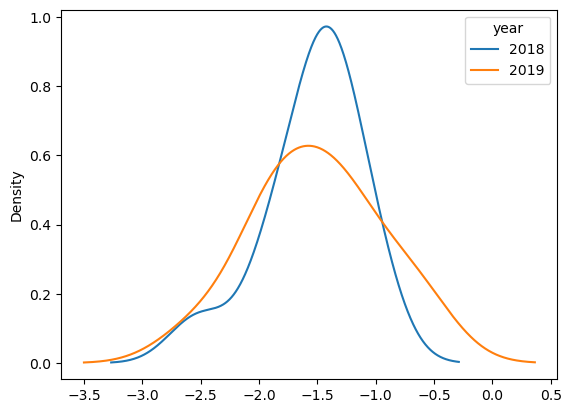

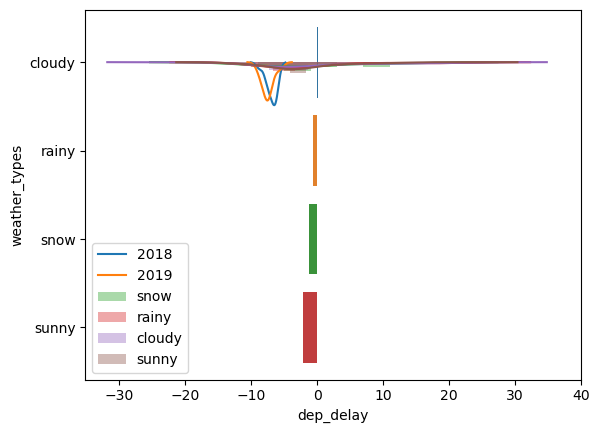

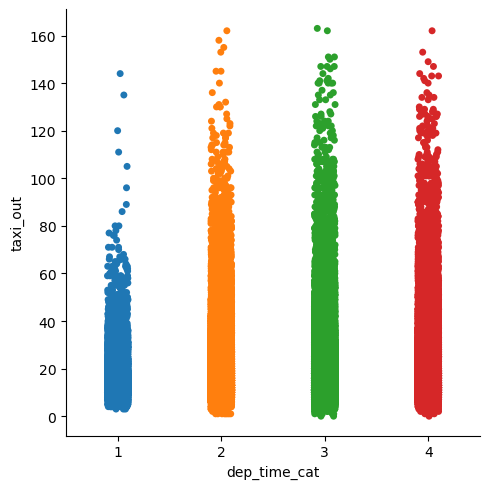

In [37]:
#plot catplot to view rough distribution
sns.catplot(x="dep_time_cat", y="taxi_out", data=df_train)
plt.show()

In [38]:
# Compare means of taxi_out times for each time of day

late_night = df_train[df_train['dep_time_cat'] == 1].mean()['taxi_out']
morning = df_train[df_train['dep_time_cat'] == 2].mean()['taxi_out']
afternoon = df_train[df_train['dep_time_cat'] == 3].mean()['taxi_out']
evening = df_train[df_train['dep_time_cat'] == 4].mean()['taxi_out']

print(f'Mean taxi_out times for late night : {late_night}')
print(f'Mean taxi_out times for morning : {morning}')
print(f'Mean taxi_out times for afternoon : {afternoon}')
print(f'Mean taxi_out times for evening : {evening}')

<ipython-input-38-4f4cd4daf8c4>:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  late_night = df_train[df_train['dep_time_cat'] == 1].mean()['taxi_out']
<ipython-input-38-4f4cd4daf8c4>:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  morning = df_train[df_train['dep_time_cat'] == 2].mean()['taxi_out']
<ipython-input-38-4f4cd4daf8c4>:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  afternoon = df_train[df_train['dep_time_cat'] == 3].mean()['taxi_out']


Mean taxi_out times for late night : 15.798816984719386
Mean taxi_out times for morning : 17.896083453639456
Mean taxi_out times for afternoon : 17.058913738019168
Mean taxi_out times for evening : 17.801891494071697


<ipython-input-38-4f4cd4daf8c4>:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  evening = df_train[df_train['dep_time_cat'] == 4].mean()['taxi_out']


In [39]:
# mean taxi_out times are lower in the late night compared to other times of the day
# mean taxi_out times are highest in the morning

In [40]:
#view count for each departure time category
df_train['dep_time_cat'].value_counts()

2    107365
4     86281
3     86075
1     14201
Name: dep_time_cat, dtype: int64

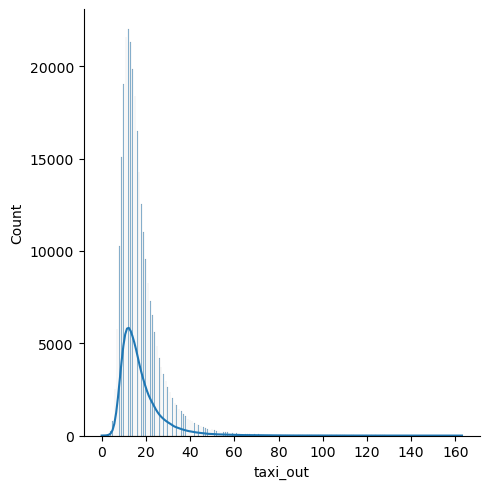

In [41]:
#Plot histogram of taxi_out to view distribution
sns.displot(df_train['taxi_out'], kde=True, legend = True)
plt.show()

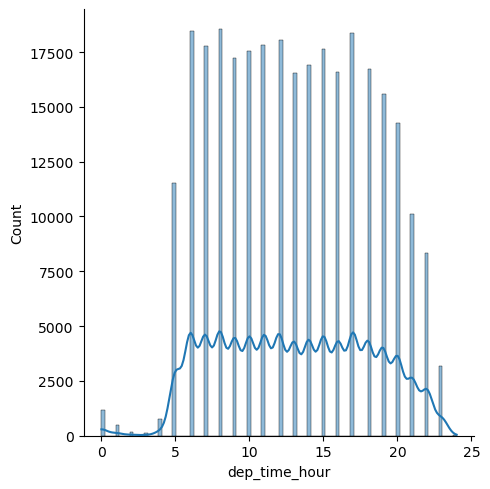

In [42]:
#Plot histogram of dep_time to view distribution
sns.displot(df_train['dep_time_hour'], kde=True)
plt.show()

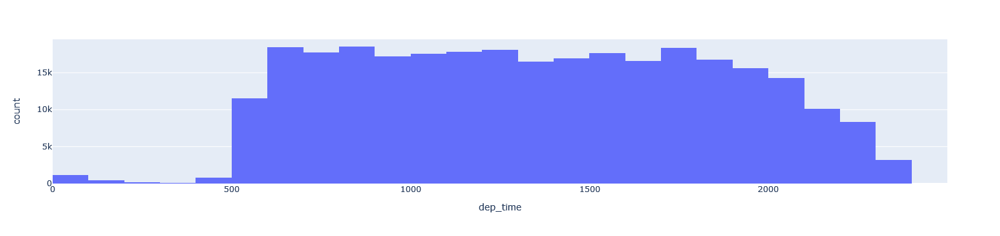

In [43]:
# plot histogram with 24 bins 
fig = px.histogram(df_train, x="dep_time", nbins=24)
fig.show()

#### **Task 5**: What is the average percentage of delays that is already created before departure? (aka are arrival delays caused by departure delays?) Are airlines able to lower the delay during the flights?

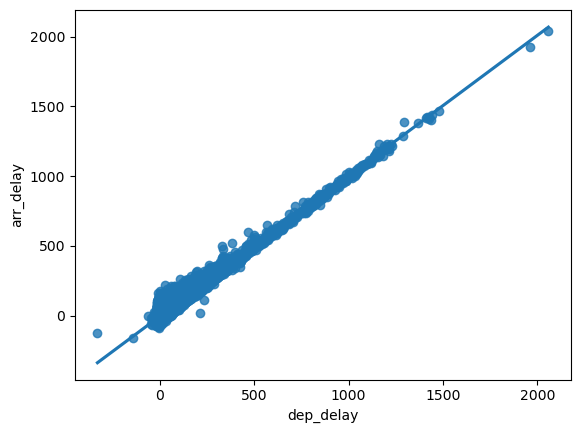

In [44]:
#regression plot for dep_delay and arr_delay
sns.regplot(data=df_train, x="dep_delay", y="arr_delay")
plt.show()

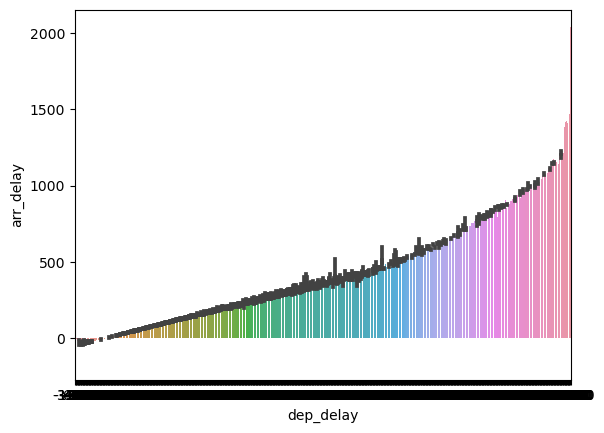

In [45]:
#create barplot for dep_delay and arr_delay
ax = sns.barplot(data=df_train, x="dep_delay", y="arr_delay")
plt.show()

In [46]:
# Scaling

scaler = StandardScaler()
df_train_scaled = pd.DataFrame(scaler.fit_transform(df_train[num_feats]))
df_train_scaled.columns = num_feats

In [47]:
df_train_scaled.head()

,dep_delay,taxi_out,taxi_in,arr_delay,distance,air_time
0,-0.011855,-0.451375,-0.772551,-0.348335,0.261843,0.200306
1,-0.157148,1.744642,-0.440346,-0.090271,-0.590164,-0.402508
2,0.029657,-0.950470,-0.606448,-0.070420,-1.043432,-1.005322
3,-0.177905,-0.651013,-0.108141,-0.546846,2.045945,1.549461
4,-0.489247,0.147539,2.051188,-0.368186,-0.090888,-0.129807


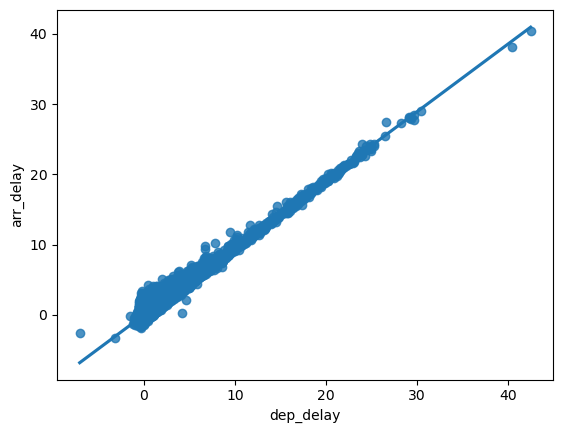

In [48]:
#regression plot for dep_delay and arr_delay scaled
sns.regplot(data=df_train_scaled, x="dep_delay", y="arr_delay")
plt.show()

In [49]:
#set target variable as y and drop target column from dataframe
y = df_train_scaled.arr_delay
df_train_scaled.drop("arr_delay",axis=1, inplace=True)

In [50]:
#Forward Regression
from sklearn.feature_selection import f_regression, SelectKBest
skb = SelectKBest(f_regression, k=4)
X = skb.fit_transform(df_train_scaled, y)


In [51]:
# This will give us the position of top columns
skb.get_support()
# column names
df_train_scaled.columns[skb.get_support()]
X = pd.DataFrame(X,columns=df_train_scaled.columns[skb.get_support()])

In [52]:
#Perform Linear Regresion on data
X = sm.add_constant(X) # adding a constant
lin_reg = sm.OLS(y,X)

# print out regression summary statistics
model = lin_reg.fit()
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:              arr_delay   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 1.776e+06
Date:                Fri, 14 Jan 2022   Prob (F-statistic):               0.00
Time:                        04:10:55   Log-Likelihood:                 57026.
No. Observations:              293922   AIC:                        -1.140e+05
Df Residuals:                  293917   BIC:                        -1.140e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.602e-16      0.000   4.36e-13      1.0

In [53]:
# R-Squared is 0.96 therefore, departure delay is highly linearly correlated to arrival delay.
# In addition, the co-efficient weight is 0.9528 which means that the importance of departure delay is highly valued
# p-value is also < 0.05 so the result is statistically significant

In [54]:
regressor = LinearRegression()
regressor.fit(X, y)

LinearRegression()

In [55]:
regressor.score(X,y)

0.9602805126138969

#### **Task 6**: How many states cover 50% of US air traffic? 

In [57]:
#drop unnessary columns, leaving fl_date, origin_city_name, dest_city_name
temp = pd.read_csv('../../../data/preprocessed_data/df_flights_clean.csv')
to_drop = ['fl_date','dest_city_name','mkt_carrier','mkt_carrier_fl_num','op_unique_carrier','origin','dest', 'crs_dep_time', 'dep_time', 'dep_delay', 'taxi_out', 'wheels_off', 'wheels_on', 'taxi_in', 'crs_arr_time', 'arr_time', 'arr_delay', 'distance', 'actual_elapsed_time', 'air_time']
temp.drop( to_drop, axis = 1, inplace=True)

In [58]:
temp.head(5)

,origin_city_name,crs_elapsed_time
0,"Baltimore, MD",160
1,"New York, NY",122
2,"Norfolk, VA",60
3,"Phoenix, AZ",258
4,"Chattanooga, TN",138


In [59]:
# split origin column and add new columns to df
temp[['origin_city','origin_state']] = temp.origin_city_name.str.split(',', expand=True)

In [60]:
#drop useless colums
drop_col = ['origin_city_name', 'origin_city']
temp.drop(drop_col, axis = 1, inplace = True)

In [61]:
flights_count = temp.origin_state.value_counts()

In [62]:
flights_count.head(5)

 CA    32554
 TX    29014
 FL    21310
 IL    18394
 GA    15628
Name: origin_state, dtype: int64

In [63]:
flights_sum=flights_count.sum()
flights_sum

293922

In [64]:
percent = flights_count * 100 /flights_sum
percent.head(5)

 CA    11.075728
 TX     9.871326
 FL     7.250223
 IL     6.258123
 GA     5.317057
Name: origin_state, dtype: float64

In [65]:
half = percent.head(26)
half

 CA    11.075728
 TX     9.871326
 FL     7.250223
 IL     6.258123
 GA     5.317057
 NY     5.034329
 NC     4.621294
 CO     3.940841
 PA     2.979702
 DC     2.977661
 WA     2.871850
 MI     2.838168
 AZ     2.651043
 NV     2.407782
 OH     2.259783
 MN     2.210450
 NJ     2.045441
 MA     1.923980
 MO     1.845047
 TN     1.734134
 UT     1.594641
 HI     1.492913
 OR     1.404794
 MD     1.402753
 LA     1.027483
 VA     0.978831
Name: origin_state, dtype: float64

In [66]:
#convert series to datafame
half2 = pd.DataFrame(half)
half2.reset_index(inplace = True)
half2.rename(columns = {'index':'state', 'origin_state' :'percentage'}, inplace = True)
half2.head(5)

,state,percentage
0,CA,11.075728
1,TX,9.871326
2,FL,7.250223
3,IL,6.258123
4,GA,5.317057


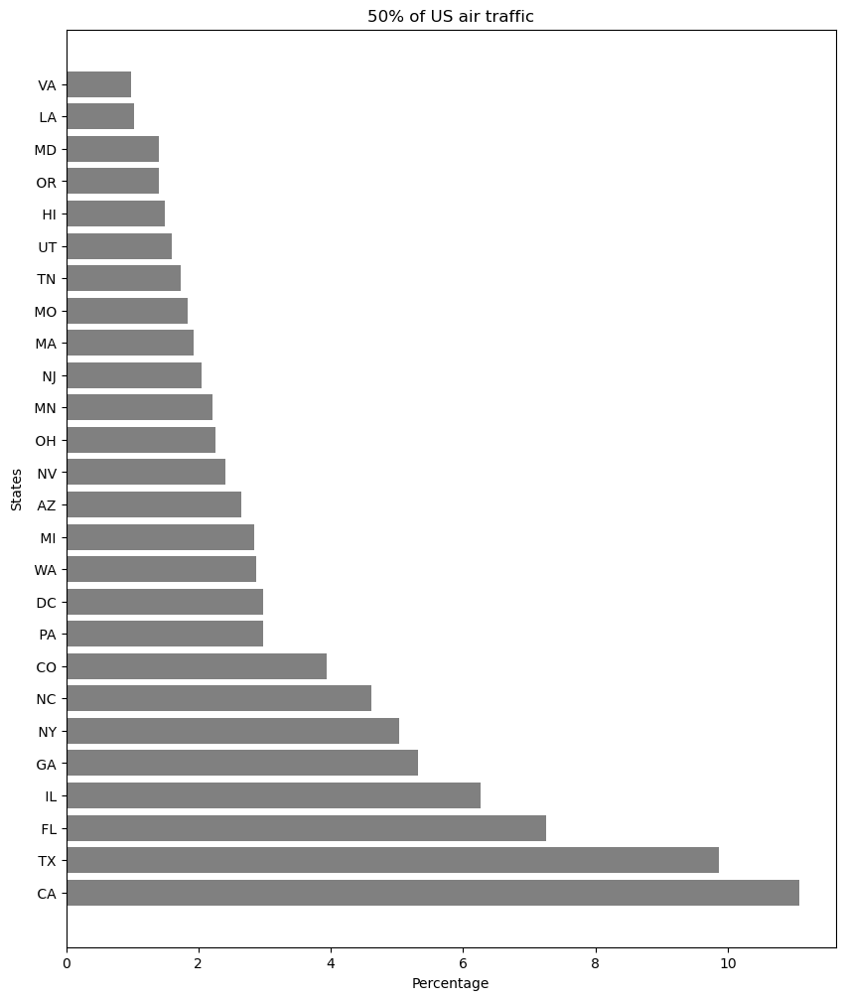

In [67]:
#plot the bar chart
plt.barh(half2.state,half2.percentage,  color='gray')
plt.ylabel("States")
plt.xlabel("Percentage")
plt.title("50% of US air traffic")
fig = plt.gcf()
fig.set_size_inches(10, 12)
plt.show()

#### **Task 7**: Test the hypothesis whether planes fly faster when there is the departure delay? 

In [69]:
#Getting the master data to further sub-set it for Task 7
data = pd.read_csv('../../../data/preprocessed_data//df_flights_clean.csv')
data.head()

,fl_date,mkt_carrier,mkt_carrier_fl_num,op_unique_carrier,origin,origin_city_name,dest,dest_city_name,crs_dep_time,dep_time,...,wheels_off,wheels_on,taxi_in,crs_arr_time,arr_time,arr_delay,crs_elapsed_time,actual_elapsed_time,air_time,distance
0,2019-05-10,WN,1912,WN,BWI,"Baltimore, MD",FLL,"Fort Lauderdale, FL",1105,1115.0,...,1128.0,1330.0,3.0,1345,1333.0,-12.0,160,138.0,122.0,925
1,2019-04-27,AA,3666,MQ,JFK,"New York, NY",CLE,"Cleveland, OH",1545,1548.0,...,1623.0,1743.0,5.0,1747,1748.0,1.0,122,120.0,80.0,425
2,2018-03-08,WN,588,WN,ORF,"Norfolk, VA",BWI,"Baltimore, MD",1000,1012.0,...,1020.0,1058.0,4.0,1100,1102.0,2.0,60,50.0,38.0,159
3,2018-04-05,AA,1618,AA,PHX,"Phoenix, AZ",MIA,"Miami, FL",1330,1332.0,...,1343.0,2019.0,7.0,2048,2026.0,-22.0,258,234.0,216.0,1972
4,2018-01-31,UA,4171,EV,CHA,"Chattanooga, TN",EWR,"Newark, NJ",600,547.0,...,606.0,745.0,20.0,818,805.0,-13.0,138,138.0,99.0,718


In [70]:
#Subsetting and cleaning the data for Task 7 -- SUBSETTED data is being reffered to as data7
data7 = data[['dep_delay', 'air_time', 'distance']]
data7 = data7.drop(data7[data7.isnull().any(axis=1)].index)
data7 = data7.reset_index(drop=True)
data7.head()


,dep_delay,air_time,distance
0,10.0,122.0,925
1,3.0,80.0,425
2,12.0,38.0,159
3,2.0,216.0,1972
4,-13.0,99.0,718


In [71]:
#Testing Hypothesis for Task 7 by comparing air speeds for varying departure times
data7['air_speed'] = data7.distance/data7.air_time
#Checking average airspeed when departure delay is less than 10
data7[data7.dep_delay < 10].air_speed.mean()

6.630284227368691

In [72]:
#Checking average airspeed when departure delay is more than 30
data7[data7.dep_delay > 30].air_speed.mean()

6.663571516012158

#### **Task 8**: When (which hour) do most 'LONG', 'SHORT', 'MEDIUM' haul flights take off?

In [73]:
#Sub setting data for Task 8
data8 = data[['dep_time', 'actual_elapsed_time']]
data8.describe()

,dep_time,actual_elapsed_time
count,293922.000000,293922.000000
mean,1335.023241,133.217041
std,503.305878,71.595458
min,1.000000,16.000000
25%,917.000000,82.000000
50%,1327.000000,115.000000
75%,1744.000000,163.000000
max,2400.000000,708.000000


In [74]:
short_haul = data8[data8.actual_elapsed_time<180]
med_haul = data8[data8.actual_elapsed_time>=180]
med_haul = med_haul[med_haul.actual_elapsed_time<=360]
long_haul = data8[data8.actual_elapsed_time>360]

In [75]:
short_haul_dep_t = (short_haul.dep_time//100).mode()
med_haul_dep_t = (med_haul.dep_time//100).mode()
long_haul_dep_t = (long_haul.dep_time//100).mode()
(long_haul.dep_time//100).mode()

0    17.0
dtype: float64

In [76]:
display(short_haul_dep_t, med_haul_dep_t, long_haul_dep_t)

0    12.0
dtype: float64

0    7.0
dtype: float64

0    17.0
dtype: float64

#### **Task 9**: Find the top 10 the bussiest airports. Does the biggest number of flights mean that the biggest number of passengers went through the particular airport? How much traffic do these 10 airports cover?

In [77]:
#For first part of Task 9
data9_start_origin=data
data9_start_origin["unique_code"]= data["fl_date"].astype(str) + data["origin"]
data9_subset_origin=data9_start_origin[['origin','unique_code']]
data9_subset_origin= data9_subset_origin[data9_subset_origin['origin'].notna()]
data9_subset_origin.columns = ['city', 'unique_origin_code']
data9_subset_origin.head()

,city,unique_origin_code
0,BWI,2019-05-10BWI
1,JFK,2019-04-27JFK
2,ORF,2018-03-08ORF
3,PHX,2018-04-05PHX
4,CHA,2018-01-31CHA


In [78]:
data9_origin_counts=data9_subset_origin.groupby(['city']).size().reset_index(name='counts_origin')

In [79]:
data9_start_dest=data
data9_start_dest["unique_code"]= data["fl_date"].astype(str) + data["dest"]
data9_subset_dest=data9_start_dest[['dest','unique_code']]
data9_subset_dest= data9_subset_dest[data9_subset_dest['dest'].notna()]
data9_subset_dest.columns = ['city', 'unique_dest_code']
data9_subset_dest.head()

,city,unique_dest_code
0,FLL,2019-05-10FLL
1,CLE,2019-04-27CLE
2,BWI,2018-03-08BWI
3,MIA,2018-04-05MIA
4,EWR,2018-01-31EWR


In [80]:
data9_dest_counts=data9_subset_dest.groupby(['city']).size().reset_index(name='counts_dest')

In [81]:
data9_subset_joined=pd.merge(data9_origin_counts, data9_dest_counts, on='city', how='inner')
sum_column_flightcounts = data9_subset_joined["counts_origin"] + data9_subset_joined["counts_dest"]
data9_subset_joined["total_flights"] = sum_column_flightcounts
data9_subset_joined.head()

,city,counts_origin,counts_dest,total_flights
0,ABE,239,230,469
1,ABI,75,81,156
2,ABQ,974,1051,2025
3,ABR,18,28,46
4,ABY,37,50,87


In [82]:
data9_sorted_flights= data9_subset_joined.sort_values(["total_flights"], ascending=False)
data9_sorted_flights.head(10)

,city,counts_origin,counts_dest,total_flights
22,ATL,14633,14686,29319
256,ORD,14536,14270,28806
95,DFW,10689,10680,21369
94,DEN,10332,10144,20476
195,LAX,9366,9512,18878
74,CLT,9336,9220,18556
320,SEA,7005,7003,14008
271,PHX,6801,6713,13514
322,SFO,6730,6643,13373
169,IAH,6705,6644,13349


In [83]:
#Second part of Task 9 starts here wherein the passenger data file is also been used to calculate traffic
passenger = pd.read_csv('../../../src/modules/data_exploration/passengers(raw).csv')
passenger.head()

,departures_scheduled,departures_performed,payload,seats,passengers,freight,mail,distance,ramp_to_ramp,air_time,...,dest_country,dest_country_name,aircraft_group,aircraft_type,aircraft_config,year,month,distance_group,class,data_source
0,1,1,51700,187,138,0,548,1670,202,186,...,US,United States,6,699,1,2018,12,4,F,DU
1,85,82,1012700,4100,3550,699,0,691,9690,7791,...,US,United States,6,675,1,2016,4,2,F,DU
2,1,1,19092,69,66,0,0,1158,173,141,...,US,United States,6,677,1,2019,6,3,F,DU
3,31,31,535355,2139,1568,0,0,1304,5710,4887,...,US,United States,6,631,1,2018,3,3,F,DU
4,5,5,186000,930,649,0,0,872,744,635,...,US,United States,6,722,1,2019,4,2,F,DU


In [84]:
years = [2018, 2019]
passenger2018_19=passenger[passenger.year.isin(years)]
passenger2018_19.head()

,departures_scheduled,departures_performed,payload,seats,passengers,freight,mail,distance,ramp_to_ramp,air_time,...,dest_country,dest_country_name,aircraft_group,aircraft_type,aircraft_config,year,month,distance_group,class,data_source
0,1,1,51700,187,138,0,548,1670,202,186,...,US,United States,6,699,1,2018,12,4,F,DU
2,1,1,19092,69,66,0,0,1158,173,141,...,US,United States,6,677,1,2019,6,3,F,DU
3,31,31,535355,2139,1568,0,0,1304,5710,4887,...,US,United States,6,631,1,2018,3,3,F,DU
4,5,5,186000,930,649,0,0,872,744,635,...,US,United States,6,722,1,2019,4,2,F,DU
6,1,1,40400,160,157,366,0,1069,290,227,...,US,United States,6,614,1,2019,5,3,F,DU


In [85]:
passenger_origin_main=passenger2018_19.drop(['dest_airport_id','dest_city_market_id','dest','dest_city_name','dest_country','dest_country_name'], axis=1)
passenger_dest_main=passenger2018_19.drop(['origin_airport_id','origin_city_market_id','origin','origin_city_name','origin_country','origin_country_name'], axis=1)
passenger_origin_final=passenger_origin_main[['passengers','origin']]
passenger_origin_final = passenger_origin_final[passenger_origin_final['origin'].notna()]
passenger_origin_final.columns = ['passengers_departure', 'city']
passenger_origin_final.head()

,passengers_departure,city
0,138,PHX
2,66,OKC
3,1568,ASE
4,649,MEM
6,157,LAS


In [86]:
passenger_dest_final=passenger_dest_main[['passengers','dest']]
passenger_dest_final = passenger_dest_final[passenger_dest_final['dest'].notna()]
passenger_dest_final.columns = ['passengers_arrival', 'city']
passenger_dest_final.head()

,passengers_arrival,city
0,138,CMH
2,66,DCA
3,1568,ATL
4,649,DEN
6,157,SAT


In [87]:
final_passengers_2018_19=pd.merge(passenger_origin_final, passenger_dest_final, on='city', how='inner')
sum_column = final_passengers_2018_19["passengers_departure"] + final_passengers_2018_19["passengers_arrival"]
final_passengers_2018_19["total_passengers"] = sum_column
final_passengers_2018_19.head()

,passengers_departure,city,passengers_arrival,total_passengers
0,138,PHX,85,223
1,138,PHX,6384,6522
2,138,PHX,4002,4140
3,138,PHX,5687,5825
4,138,PHX,183,321


In [88]:
super_final_passengers_task9=final_passengers_2018_19.groupby('city', as_index=False).agg({"total_passengers": "sum"})
percentage_column=super_final_passengers_task9['total_passengers']/super_final_passengers_task9['total_passengers'].sum()
super_final_passengers_task9['percentage_contribution']=percentage_column*100
super_final_passengers_task9.head()

,city,total_passengers,percentage_contribution
0,05A,15,6.888314e-08
1,7AK,573,2.631336e-06
2,A03,0,0.000000e+00
3,A43,604,2.773694e-06
4,ABE,1022625,4.696108e-03


In [89]:
sorted_super_final_passengers= super_final_passengers_task9.sort_values(["total_passengers"], ascending=False)
sorted_super_final_passengers.head(10)

,city,total_passengers,percentage_contribution
572,ORD,2337419828,10.733921
52,ATL,2192050878,10.066356
425,LAX,2079598304,9.549950
191,DEN,1701548092,7.813865
192,DFW,1014610570,4.659304
367,JFK,837201472,3.844604
701,SFO,805642026,3.699677
498,MIA,774544327,3.556870
244,EWR,760114747,3.490606
345,IAH,641423280,2.945550


#### **Task 10**: Do bigger delays lead to bigger fuel comsumption per passenger? 
We need to do four things to answer this as accurate as possible:
- Find out average monthly delay per air carrier (monthly delay is sum of all delays in 1 month)
- Find out distance covered monthly by different air carriers
- Find out number of passengers that were carried by different air carriers
- Find out total fuel comsumption per air carrier.

Use this information to get the average fuel comsumption per passenger per km. Is this higher for the airlines with bigger average delays?

In [90]:
#First part of Task 10
data10=data
data10_carrier=data10[['mkt_carrier','dep_delay','arr_delay']]
data10_carrier['total_delay']=data10_carrier['dep_delay'] + data10_carrier['arr_delay']
data10_carrier.head(10)

<ipython-input-90-69a57274e0e9>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,mkt_carrier,dep_delay,arr_delay,total_delay
0,WN,10.0,-12.0,-2.0
1,AA,3.0,1.0,4.0
2,WN,12.0,2.0,14.0
3,AA,2.0,-22.0,-20.0
4,UA,-13.0,-13.0,-26.0
5,UA,-5.0,-8.0,-13.0
6,AA,-10.0,-22.0,-32.0
7,DL,-3.0,-5.0,-8.0
8,WN,2.0,-16.0,-14.0
9,UA,18.0,9.0,27.0


In [91]:
data10_carrier.groupby(['mkt_carrier']).mean()


,dep_delay,arr_delay,total_delay
mkt_carrier,,,
AA,10.215030,6.381640,16.596670
AS,3.622181,0.794956,4.417138
B6,16.472501,11.477069,27.949571
DL,9.348025,2.541737,11.889761
F9,17.919164,12.437104,30.356268
G4,11.554696,9.217983,20.772679
HA,0.855129,0.498200,1.353329
NK,10.450218,4.963425,15.413643
UA,13.285559,9.553012,22.838570


In [92]:
#Second part of Task 10
data10_distance=data[['mkt_carrier','distance']]
data10_distance.groupby(['mkt_carrier']).mean()

,distance
mkt_carrier,
AA,697.894775
AS,993.690275
B6,1094.333821
DL,703.654582
F9,1042.602153
G4,876.436766
HA,659.490702
NK,1016.181567
UA,789.818236


In [93]:
#import data into dataframe
df_fuel = pd.read_csv('../../../data/preprocessed_data/df_fuel_clean.csv')
df_fuel.head()


,month,airline_id,carrier,carrier_name,total_gallons,total_cost,year
0,8,20287.0,WP,Island Air Hawaii,97531.0,173454,2015
1,2,20310.0,WL,"Caribbean Sun Airlines, Inc. d/b/a World Atlan...",61164.0,253856,2018
2,10,20436.0,F9,Frontier Airlines Inc.,16936487.0,24008936,2015
3,3,20422.0,SY,Sun Country Airlines d/b/a MN Airlines,7433108.0,18341680,2019
4,2,20436.0,F9,Frontier Airlines Inc.,15240623.0,14937147,2016


In [94]:
#use groupby method to find sum of total_gallons per carrier
total_fuel = df_fuel.groupby(['carrier_name'])['total_gallons'].sum()

In [95]:
#convert series into dataframe and turn total_gallons into integer type
total_fuel_con = total_fuel.to_frame()
total_fuel_con['total_gallons'] = total_fuel_con['total_gallons'].astype('int64')
total_fuel_con.head()

,total_gallons
carrier_name,
ABX Air Inc,6367883
Air Transport International,40611711
Air Wisconsin Airlines Corp,130683426
Alaska Airlines Inc.,2678455461
Allegiant Air,849762053


In [96]:
#reading the csv data dile
passengers = pd.read_csv('../../../data/preprocessed_data/df_passengers_clean.csv')
passengers.shape

(50000, 15)

In [97]:
passengers.head()

,departures_performed,seats,passengers,distance,air_time,unique_carrier,airline_id,origin_airport_id,origin,dest_airport_id,dest,aircraft_group,aircraft_type,year,month
0,1,187,138,1670,186,AA,19805,14107,PHX,11066,CMH,6,699,2018,12
1,82,4100,3550,691,7791,MQ,20398,11298,DFW,13367,MLI,6,675,2016,4
2,1,69,66,1158,141,YX,20452,13851,OKC,11278,DCA,6,677,2019,6
3,31,2139,1568,1304,4887,OO,20304,10372,ASE,10397,ATL,6,631,2018,3
4,5,930,649,872,635,F9,20436,13244,MEM,11292,DEN,6,722,2019,4


In [101]:
#droping unnessary columns
drop_col = ['departures_performed', 'seats', 'distance', 'air_time', 'origin_airport_id', 'origin',
            'dest_airport_id', 'dest',
            'aircraft_group', 'aircraft_type', 'year', 'month']
passengers = passengers.drop(columns = drop_col)
passengers

,passengers,unique_carrier,airline_id
0,138,AA,19805
1,3550,MQ,20398
2,66,YX,20452
3,1568,OO,20304
4,649,F9,20436
...,...,...,...
49995,11,H6,20336
49996,5,8E,20331
49997,95,AA,19805
49998,83,AS,19930


In [102]:
#passengers.groupby(['carrier_name', 'group', 'term']).size().unstack(fill_value=0)
pas = passengers[['unique_carrier', 'passengers']].groupby('unique_carrier', as_index=False).sum()
new_data_set = pas.sort_values('passengers', ascending = False).head(10)

In [103]:
new_data_set

,unique_carrier,passengers
326,WN,16798576
147,DL,16651140
97,AA,14912292
301,UA,11793877
119,B6,3982778
247,OO,3799764
112,AS,3027175
240,NK,2680685
161,F9,1813584
340,YX,1753555
